# HW 4 - Levi Schult 
* notebook with image processing

In [130]:
# import block
import numpy as np
from astropy.io import fits
from matplotlib import pyplot as plt
from matplotlib import rc
%matplotlib inline
from astropy.visualization import hist
from ccdproc import ImageFileCollection
import ccdproc as ccdp
from astropy.modeling import fitting
from astropy.modeling.models import Polynomial1D,Chebyshev1D,Legendre1D,Hermite1D
from astropy.nddata import CCDData
phot_tutorial_dir = '/Users/levischult/Desktop/classes/ccd-reduction-and-photometry-guide/notebooks/'
import sys
sys.path.insert(0,phot_tutorial_dir)
from convenience_functions import show_image

In [131]:
# setting data directory
data_dir = '/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imagedataset/'
tag_dir = '/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imgs_wtags/'
reduced_dir = '/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/reduced/'

* displaying log file in notebook for future reference!

In [132]:
! cat /Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imagedataset/log.txt

2009 June 22 local (23rd UT)
Observer: Kobulnicky, J. Runnoe, J. Dornfeld
Clearish, 55F, Humidity 56%
Winds 020 @ 10 mph
Image	Object		exp	Filt	UT	Notes
a005-10	SkyFlats	1	Halpha	
11-14			2	Halpha
15-20			3	Halpha
21			3	U		saturated
22			3	U
23-28			3	U		
29			3	B		     saturated
30			3	B		     saturated
31			3	B		     saturated
32			1	B		     30,000 cts
33			2	B		     
34			3	B		     saturated?
35			3	B	3:13	     
36			3	B	
37			3	B		
38			3	B	
39			4	B	previously not tracking; now tracking
40			5	B    
41			6	B
42			6	B	
43			3	V	3:21
44			6	V	
45			12	V
46			12	V
47			20	V
48			20	V
49			20	V
50			15	R
51			20	R
52			25	R
53			30	R
54			40	R
55			50	R
56			50	I   bad
57			50	I
58			80	I
59			120	I
60			120	I
61			200	I
62			200	I
63 bad
64 focus PG1633+099	2	V	focus=0   3.9 pix fwhm
65 focus			V	focus=200 3.4
66 focus			V	focus=400 5.7
67 focus			V	focus=400 again 6.6 worse!
68 focus			V	focus=250  4.4
69				V	focus=100  3.3
70				V	focus=0	   3.7
71				V	focus=-100 3.1
72				V	foc

In [133]:
# basic image plotting function. taken from image_combination notebook

def basicimgplot(array, titl='Title'):
    min_level = array.min()
    max_level = array.max()
    fig = plt.subplots(1,1,figsize=(4,4))
    plt.imshow(array, vmin=min_level, vmax=max_level)
    plt.xticks([])
    plt.yticks([])
    plt.title(titl)
    plt.grid(False)
    plt.show()

In [134]:
def rms(array):
    return np.sqrt(np.mean(array**2))

# 2

### examining images for overscan regions
* Column 51
* Column 2102
* a123.fits below:

![Screenshot 2023-10-23 at 13.34.16.png](<attachment:Screenshot 2023-10-23 at 13.34.16.png>)
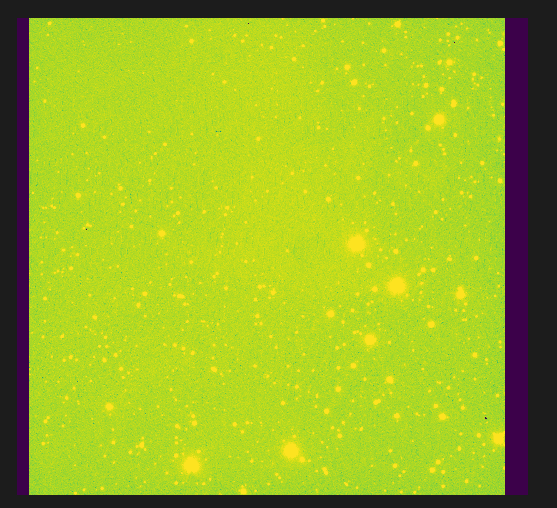

### plotting bias frame!
* a098.fits

![Screenshot 2023-10-23 at 13.42.16.png](<attachment:Screenshot 2023-10-23 at 13.42.16.png>)
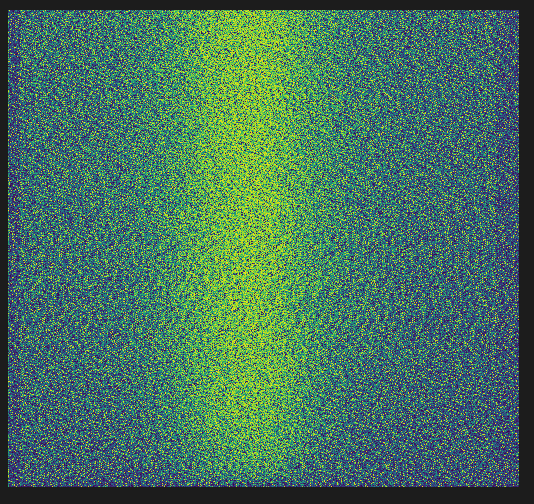

### plotting dark
* d008.fit

![Screenshot 2023-10-23 at 13.44.11.png](<attachment:Screenshot 2023-10-23 at 13.44.11.png>)
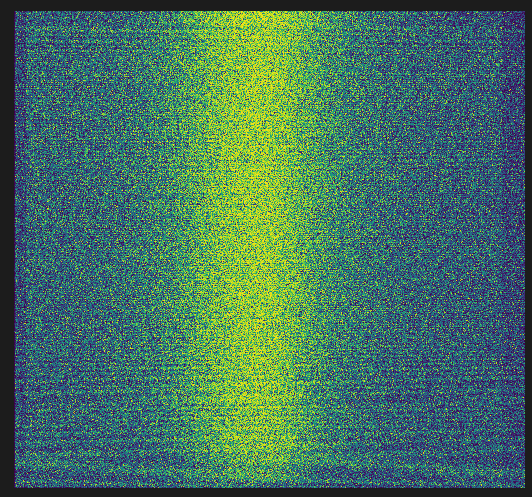

### plotting flat
* a008.fits

![Screenshot 2023-10-23 at 13.46.12.png](<attachment:Screenshot 2023-10-23 at 13.46.12.png>)
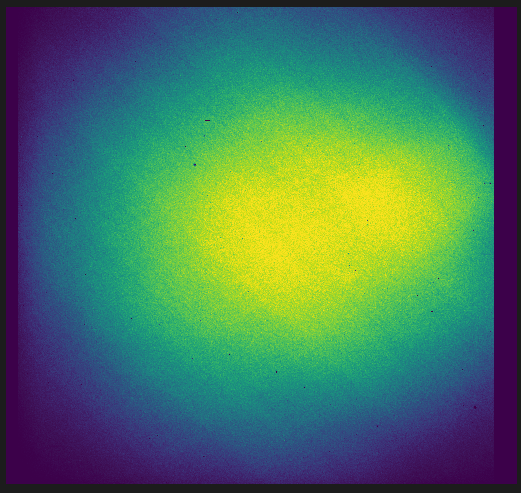

# 3

* plotting lines + columns from bias frame

In [135]:
hdu = fits.open(data_dir+'a098.fits')
hdr = hdu[0].header
img = hdu[0].data

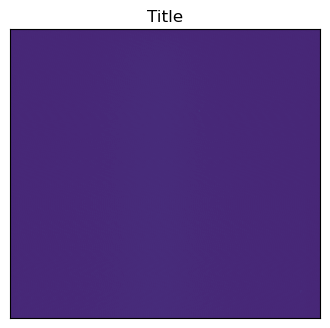

In [136]:
#basicimgplot(img[800:1200, 500:1600])
basicimgplot(img)

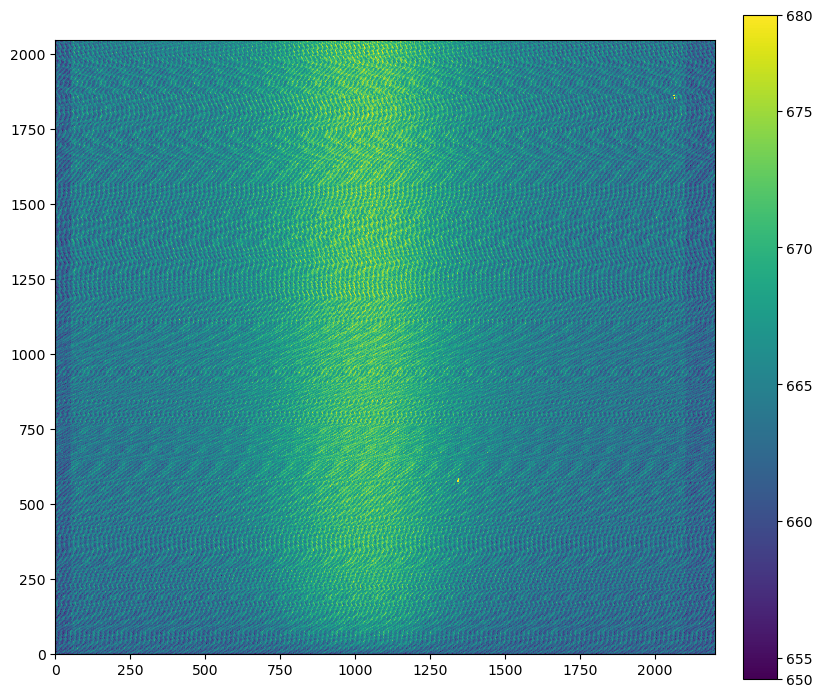

In [137]:
show_image(img)

In [138]:
# min_level = array.min()
# max_level = array.max()
# fig = plt.subplots(1,1,figsize=(4,4))
# plt.imshow(array, vmin=min_level, vmax=max_level)
# plt.xticks([])
# plt.yticks([])
# plt.title(titl)
# plt.grid(False)
# plt.show()

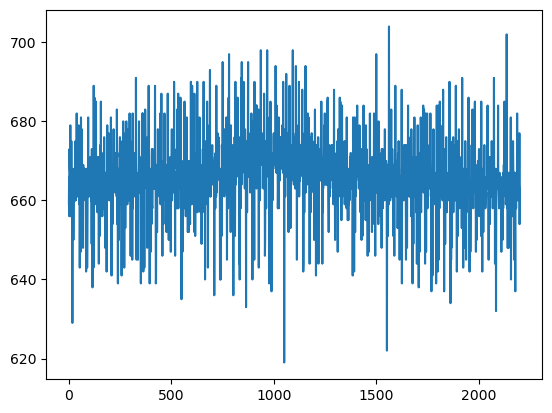

In [139]:
plt.plot(img[1024,:]) # 1024 row

* mean + rms of entire image

In [140]:
mean_bias = np.mean(img)
print(mean_bias)

665.6369082919034


In [141]:
rms_bias = np.sqrt(np.mean(img**2))
print(rms_bias)

212.656196864974


* mean/rms of center of image

In [142]:
bias_center = img[512:1536, 512:1536]
mean_bias = np.mean(bias_center)
print(mean_bias)

668.0392589569092


In [143]:
rms_bias = rms(bias_center)
print(rms_bias)

217.0860314370543


# 5
* finding overscan regions in python rather than DS9

In [144]:
hdu = fits.open(data_dir+'a128.fits')
hdr = hdu[0].header
img = hdu[0].data

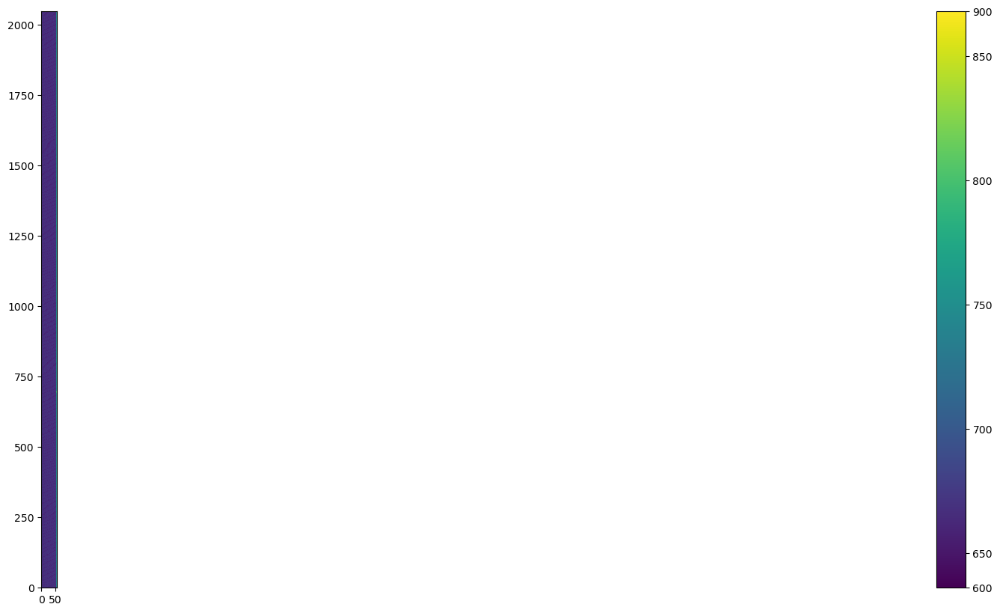

In [145]:
show_image(img[:, :54])

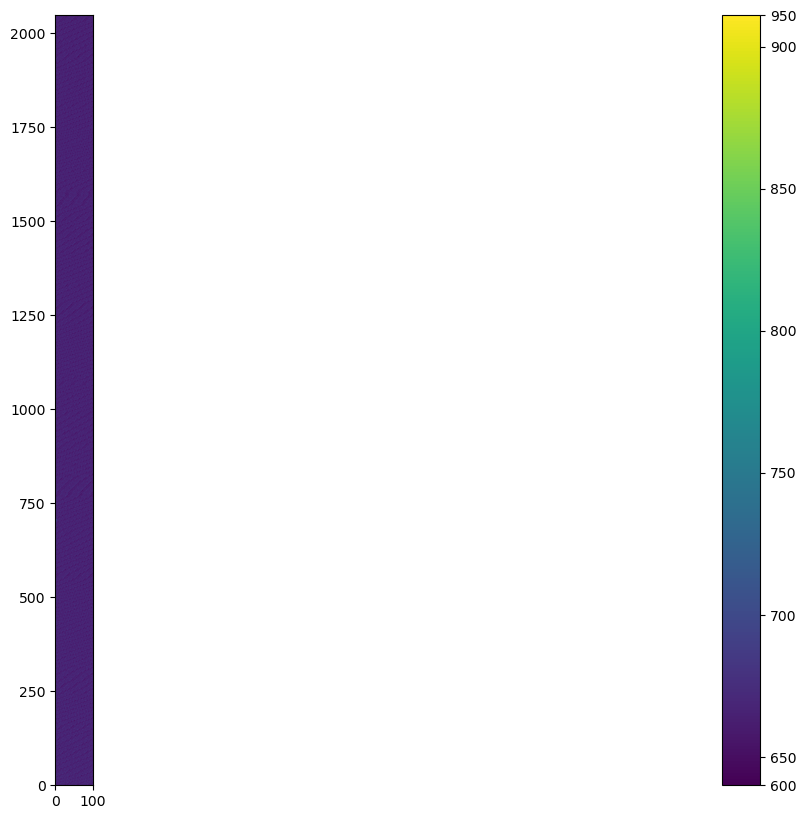

In [146]:
show_image(img[:, 2099:])

* image starts on 55 and ends on 2098

* adding headers to the images: BIASSEC, TRIMSEC, FILTER, and IMAGETYP

In [147]:
TRIMSEC_FITS = '[56:2100, :]'
TRIMSEC_PYTH = '[:, 55:2099]'

BIASSEC_R_FITS = '[2099:, :]'
BIASSEC_R_PYTH = '[:, 2098:]'

BIASSEC_L_FITS = '[:56, :]'
BIASSEC_L_PYTH = '[:, :55]'

In [148]:
# adding headers:





# skyflats
for i in range(5, 11):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'Halpha'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'SkyFlats'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

# science images
for i in range(11, 21):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'Halpha'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'SkyFlats'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(21, 29):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'U'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'SkyFlats'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(29, 43):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'B'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'SkyFlats'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(43, 50):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'SkyFlats'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(50, 56):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'R'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'SkyFlats'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(56, 63):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'I'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'SkyFlats'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(64, 81):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(64, 81):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(81, 83):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'U'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(83, 85):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'B'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(85, 87):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(87, 89):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'R'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(89, 91):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'I'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(91, 93):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'Halpha'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)


for i in range(93, 112):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'N/A'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'Bias'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(130, 132):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'U'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(132, 134):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'B'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(134, 136):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)


for i in range(136, 138):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'R'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(138, 140):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'I'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)


for i in range(153, 155):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'I'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'NGC6823'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)


for i in range(155, 157):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'R'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'NGC6823'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)


for i in range(157, 160):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'NGC6823'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(160, 162):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'B'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'NGC6823'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(162, 164):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'U'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'NGC6823'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(202, 204):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'U'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(204, 206):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'B'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(206, 208):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)


for i in range(208, 210):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'R'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(210, 212):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'I'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(221, 223):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'U'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(223, 227):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'B'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(227, 231):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)


for i in range(231, 233):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'R'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(233, 235):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'I'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(235, 237):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'R'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(237, 239):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'U'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(239, 241):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'B'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(241, 243):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'V'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)


for i in range(243, 245):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'R'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(245, 247):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'a' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'I'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'PG1633+099'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)

for i in range(1, 16):
    if len(str(i)) == 1:
        fnum = '00' + str(i)
    if len(str(i)) == 2:
        fnum = '0' + str(i)
    filename = 'd' + fnum + '.fits'
    hdu = fits.open(data_dir + filename)
    hdr = hdu[0].header
    hdr['FILTER'] = 'N/A'
    hdr['TRIMSEC'] = TRIMSEC_FITS
    hdr['IMAGETYP'] = 'Dark'
    hdr['BIASSEC_R'] = BIASSEC_R_FITS # right overscan region
    hdr['BIASSEC_L'] = BIASSEC_L_FITS # left overscan region
    hdu.writeto(tag_dir + filename, overwrite=True)



KeyboardInterrupt: 

In [ ]:
imgs = ccdp.ImageFileCollection(tag_dir, glob_include='*.fits')

In [ ]:
biasframes = imgs.files_filtered(imagetyp='Bias', include_path=True)
biasframes

['/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imgs_wtags/a093.fits',
 '/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imgs_wtags/a094.fits',
 '/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imgs_wtags/a095.fits',
 '/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imgs_wtags/a096.fits',
 '/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imgs_wtags/a097.fits',
 '/Users/levischult/Desktop/classes/astr_8060_f23/work/schultls/misc_works/imgs_wtags/a098.fits']

* mean/median for image region of bias frames

In [ ]:
biasframes = imgs.files_filtered(imagetyp='Bias')
biasmean = []
biasmedi = []

for file in biasframes:
    hdu = fits.open(tag_dir+file)
    hdr = hdu[0].header
    img = hdu[0].data
    biasmean.append(np.mean(img[:, 55:2098]))
    biasmedi.append(np.median(img[:, 55:2098]))
    print(f'mean:{np.mean(img[:, 55:2098])}')
    print(f'median:{np.median(img[:, 55:2098])}')

mean:666.0853474038638
median:666.0
mean:665.7560371925478
median:666.0
mean:665.8097407209832
median:666.0
mean:665.9230458711912
median:666.0
mean:665.912636613589
median:666.0
mean:665.8885719721304
median:666.0


* bias overscan regions

In [ ]:
biasframes = imgs.files_filtered(imagetyp='Bias')
biasovrsmn = [] # overscan means
biasovrsmd = [] # overscan median

for file in biasframes:
    hdu = fits.open(data_dir+file)
    hdr = hdu[0].header
    img = hdu[0].data
    totalovrscn = np.zeros((2048,157))
    totalovrscn[:, :55] = img[:, :55]
    totalovrscn[:, 55:] = img[:, 2098:]
    biasovrsmn.append(np.mean(totalovrscn))
    biasovrsmd.append(np.median(totalovrscn))
    print(f'mean:{np.mean(totalovrscn)}')
    print(f'median:{np.median(totalovrscn)}')

mean:662.5504080414013
median:663.0
mean:662.223623482285
median:662.0
mean:662.2753564142117
median:662.0
mean:662.3959307822453
median:663.0
mean:662.3682231538614
median:663.0
mean:662.3620745421974
median:663.0


* getting mean/median of overscan regions for the rest of the night

* bias overscan regions

In [ ]:
PGframes = imgs.files_filtered(imagetyp='PG1633+099')
print(PGframes)
PGovrsmn = [] # PG overscan means
PGovrsmd = [] # PG overscan median

for file in PGframes:
    hdu = fits.open(tag_dir+file)
    hdr = hdu[0].header
    img = hdu[0].data
    print(file)
    print(img.shape)
    totalovrscn = np.zeros((2048,157))
    totalovrscn[:, :55] = img[:, :55]
    totalovrscn[:, 55:] = img[:, 2098:]
    PGovrsmn.append(np.mean(totalovrscn))
    PGovrsmd.append(np.median(totalovrscn))
    print(f'mean:{np.mean(totalovrscn)}')
    print(f'median:{np.median(totalovrscn)}')

['a064.fits' 'a065.fits' 'a066.fits' 'a067.fits' 'a068.fits' 'a069.fits'
 'a070.fits' 'a071.fits' 'a072.fits' 'a073.fits' 'a074.fits' 'a075.fits'
 'a076.fits' 'a077.fits' 'a078.fits' 'a079.fits' 'a080.fits' 'a081.fits'
 'a082.fits' 'a083.fits' 'a084.fits' 'a085.fits' 'a086.fits' 'a087.fits'
 'a088.fits' 'a089.fits' 'a090.fits' 'a091.fits' 'a092.fits' 'a099.fits']
a064.fits
(2048, 2200)
mean:660.5969067227309
median:661.0
a065.fits
(2048, 2200)
mean:659.8498581807324
median:660.0
a066.fits
(2048, 2200)
mean:661.0461627935907
median:661.0
a067.fits
(2048, 2200)
mean:660.3001156946656
median:660.0
a068.fits
(2048, 2200)
mean:661.2890313992834
median:661.0
a069.fits
(2048, 2200)
mean:660.2572993381767
median:660.0
a070.fits
(2048, 2200)
mean:661.320620397094
median:661.0
a071.fits
(2048, 2200)
mean:660.4335906399283
median:660.0
a072.fits
(2048, 2200)
mean:661.3956228851513
median:661.0
a073.fits
(2048, 2200)
mean:660.478335240844
median:660.0
a074.fits
(2048, 2200)
mean:661.338279383957
m

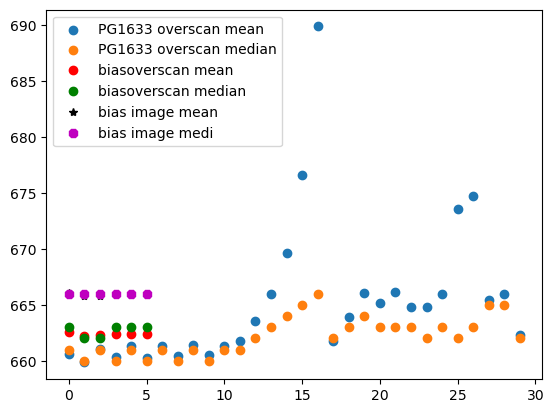

In [ ]:
fig, ax = plt.subplots()
domain = range(len(PGovrsmn))
ax.scatter(domain, PGovrsmn, label='PG1633 overscan mean')
ax.scatter(domain, PGovrsmd, c='C1', label='PG1633 overscan median')
ax.plot(biasovrsmn, 'ro', label='biasoverscan mean')
ax.plot(biasovrsmd, 'go', label='biasoverscan median')
ax.plot(biasmean, 'k*', label='bias image mean')
ax.plot(biasmedi, 'm8', label='bias image medi')
ax.legend()
plt.show()

* overscan region has a lot of variation throughout the night so it wouldn't be\
a good idea to just use the levels from the initial bias frames. Additionally the\
mean captures more information since the median is restricted to integer values\
since it is calculated over whole number counts. While the overscan could be used\
for the entire night to get the time-dependent variations, the image section of \
the bias frames can calibrate the center of the image throughout the night.

# 6

* trimming one image for proof of concept of overscan

In [ ]:
len(PGframes)

30

In [ ]:
biasframes = imgs.files_filtered(imagetyp='Bias', include_path=True)


b1 = CCDData.read(biasframes[0], unit='adu')
# b1_ovrscsub = ccdp.subtract_overscan(b1, overscan=b1[:, :2099]) # sbtrkt larger overscan region
# b1_ovrsctrm = ccdp.trim_image(b1_ovrscsub[:, :2098])
# b1_ovrsctrm = ccdp.trim_image(b1_ovrsctrm[:, 55:])
# b1_ovrsctrm.shape

* modeling the columns rather than the rows now per Jessie's suggestion.

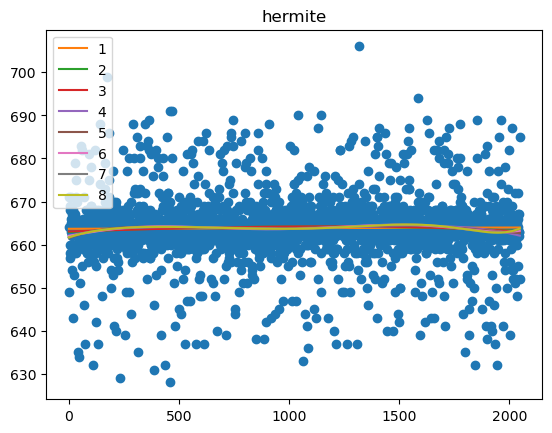

In [ ]:
# Hermite model plot
fig, ax = plt.subplots()
domain = range(b1[:,2099].shape[0])
plt.scatter(domain, b1[:,2099])

for degree in range(1,9):
    herm = Hermite1D(degree)
    fitter_herm = fitting.LinearLSQFitter()
    bestfit_herm = fitter_herm(herm, domain, np.array(b1[:,2099]))
    #plt.title(f'herm degree={degree}')
    plt.plot(domain, bestfit_herm(domain),c=f'C{degree}', label=degree)
ax.set_title('hermite')
ax.legend()
plt.show()

* not much change across degrees of hermitian - 8th degree seems to be an overfit

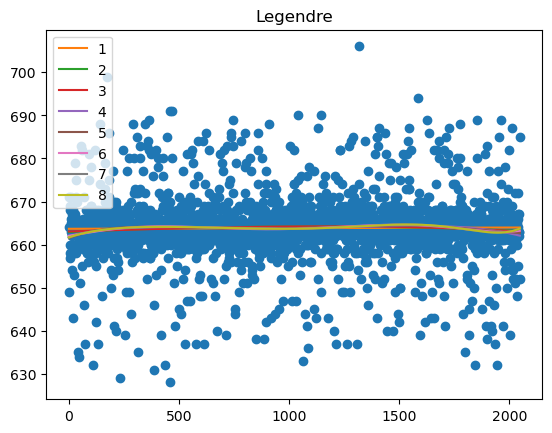

In [ ]:
# Legendre model plotting
fig, ax = plt.subplots()
domain = range(b1[:,2099].shape[0])
plt.scatter(domain, b1[:,2099], )

for degree in range(1,9):
    lege = Legendre1D(degree)
    fitter = fitting.LinearLSQFitter()
    bestfit = fitter_herm(lege, domain, np.array(b1[:,2099]))
    #plt.title(f'herm degree={degree}')
    plt.plot(domain, bestfit(domain),c=f'C{degree}', label=degree)
ax.set_title('Legendre')
ax.legend()
plt.show()

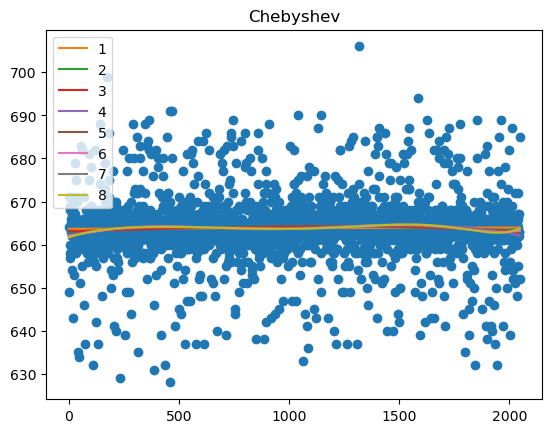

In [ ]:
# Chebyshev model plotting
fig, ax = plt.subplots()
domain = range(b1[:,2099].shape[0])
plt.scatter(domain, b1[:,2099], )

for degree in range(1,9):
    cheb = Chebyshev1D(degree)
    fitter = fitting.LinearLSQFitter()
    bestfit = fitter_herm(cheb, domain, np.array(b1[:,2099]))
    #plt.title(f'herm degree={degree}')
    plt.plot(domain, bestfit(domain),c=f'C{degree}', label=degree)
ax.set_title('Chebyshev')
ax.legend()
plt.show()

 [astropy.modeling.fitting]



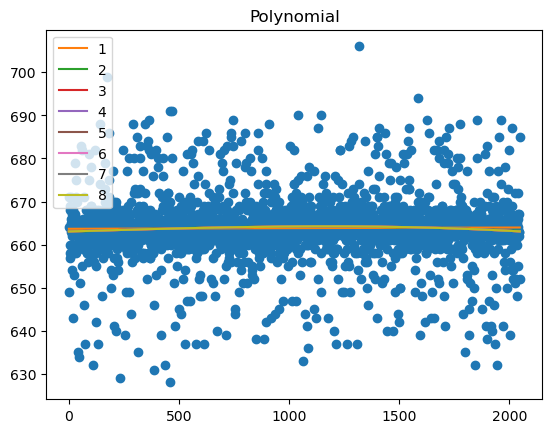

In [ ]:
# Polynomial model plotting
fig, ax = plt.subplots()
domain = range(b1[:,2099].shape[0])
plt.scatter(domain, b1[:,2099], )

for degree in range(1,9):
    poly = Polynomial1D(degree)
    fitter = fitting.LinearLSQFitter()
    bestfit = fitter_herm(poly, domain, np.array(b1[:,2099]))
    #plt.title(f'herm degree={degree}')
    plt.plot(domain, bestfit(domain),c=f'C{degree}', label=degree)
ax.set_title('Polynomial')
ax.legend()
plt.show()

* They all do a pretty good or equal job modeling the overscan region with the \
higher degrees looking almost the same as lower ones

In [ ]:
PGframes = imgs.files_filtered(imagetyp='PG1633+099', include_path=True)


In [ ]:
# ’chebyshev’, ’legendre’, and ’hermite’, and ’polynomial'

PGframes = imgs.files_filtered(imagetyp='PG1633+099', include_path=True)
cheb_array = np.zeros(shape=(8, 30, 2048, 2200)) # degree, frame number, image(2048x2043)
lege_array = np.zeros(shape=(8, 30, 2048, 2200))
herm_array = np.zeros(shape=(8, 30, 2048, 2200))
poly_array = np.zeros(shape=(8, 30, 2048, 2200))

# mean of overscan region for comparison to 
cheb_omean = np.zeros((8,30))
lege_omean = np.zeros((8,30))
herm_omean = np.zeros((8,30))
poly_omean = np.zeros((8,30))

cheb_omedi = np.zeros((8,30)) # median
lege_omedi = np.zeros((8,30))
herm_omedi = np.zeros((8,30))
poly_omedi = np.zeros((8,30))

cheb_orms = np.zeros((8,30)) # rms
lege_orms = np.zeros((8,30))
herm_orms = np.zeros((8,30))
poly_orms = np.zeros((8,30))


img_omean = np.zeros((1,30))

for degree in range(1, 9): # getting degrees 1-8 for overscan modeling
    for fidx, file in enumerate(PGframes):
        # define model
        cheb = Chebyshev1D(degree)
        lege = Legendre1D(degree)
        herm = Hermite1D(degree)
        poly = Polynomial1D(degree)
        # load image
        # hdu = fits.open(tag_dir+file)
        # hdr = hdu[0].header
        # img = hdu[0].data
        img = CCDData.read(file, unit='adu')
        # modeling + subtracting overscan + saving all the versions for comparison
        img_cheb = ccdp.subtract_overscan(img, overscan=img[:, 2099:], model=cheb)
        cheb_array[degree-1, fidx, :, :] = np.array(img_cheb)
        img_lege = ccdp.subtract_overscan(img, overscan=img[:, 2099:], model=lege)
        lege_array[degree-1, fidx, :, :] = np.array(img_lege)
        img_herm = ccdp.subtract_overscan(img, overscan=img[:, 2099:], model=herm)
        herm_array[degree-1, fidx, :, :] = np.array(img_herm)
        img_poly = ccdp.subtract_overscan(img, overscan=img[:, 2099:], model=poly)
        poly_array[degree-1, fidx, :, :] = np.array(img_poly)
        # assembling pre/post subtracting averages for comparison
        img_ovrsc_mean = np.mean(img[:,2099:])
        img_cheb_omean = np.mean(img_cheb[:,2099:])
        img_lege_omean = np.mean(img_lege[:,2099:])
        img_herm_omean = np.mean(img_herm[:,2099:])
        img_poly_omean = np.mean(img_poly[:,2099:])

        img_cheb_omedi = np.median(img_cheb[:,2099:])
        img_lege_omedi = np.median(img_lege[:,2099:])
        img_herm_omedi = np.median(img_herm[:,2099:])
        img_poly_omedi = np.median(img_poly[:,2099:])

        img_cheb_orms = np.sqrt(np.mean(np.array(img_cheb[:,2099:])**2))
        img_lege_orms = np.sqrt(np.mean(np.array(img_lege[:,2099:])**2))
        img_herm_orms = np.sqrt(np.mean(np.array(img_herm[:,2099:])**2))
        img_poly_orms = np.sqrt(np.mean(np.array(img_poly[:,2099:])**2))

        img_omean[0, fidx] = img_ovrsc_mean
        cheb_omean[degree-1, fidx] = img_cheb_omean
        lege_omean[degree-1, fidx] = img_lege_omean
        herm_omean[degree-1, fidx] = img_herm_omean
        poly_omean[degree-1, fidx] = img_poly_omean

        cheb_orms[degree-1, fidx] = img_cheb_orms
        lege_orms[degree-1, fidx] = img_lege_orms
        herm_orms[degree-1, fidx] = img_herm_orms
        poly_orms[degree-1, fidx] = img_poly_orms
        # trimming off overscan regions
        img_chebt = ccdp.trim_image(img_cheb[:, :2099])
        img_chebt = ccdp.trim_image(img_cheb[:, 55:])
        img_leget = ccdp.trim_image(img_lege[:, :2099])
        img_leget = ccdp.trim_image(img_lege[:, 55:])
        img_hermt = ccdp.trim_image(img_herm[:, :2099])
        img_hermt = ccdp.trim_image(img_herm[:, 55:])
        img_polyt = ccdp.trim_image(img_poly[:, :2099])
        img_polyt = ccdp.trim_image(img_poly[:, 55:])
        # saving subtracted/trimmed images
        if degree == 3: # see below for why i chose 3rd degree chebyshev
            img_chebt.write(reduced_dir + file[83:-5] + '_ot.fits', overwrite=True)


 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.modeling.fitting]

 [astropy.mode

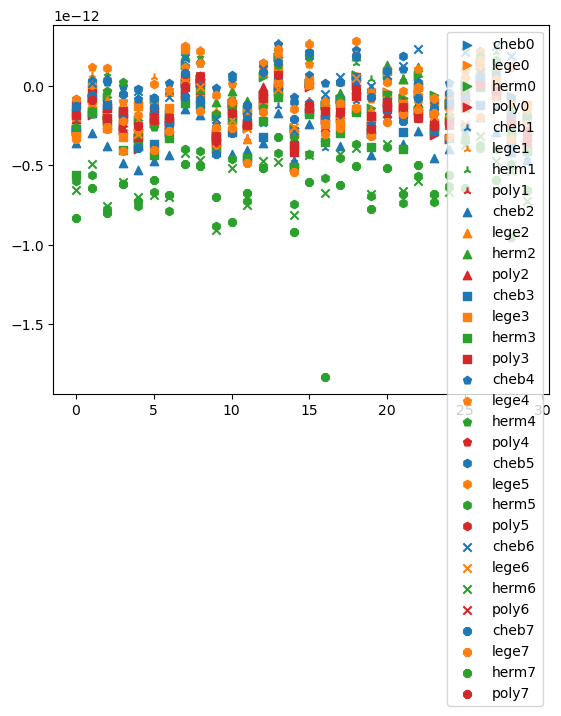

In [ ]:
fig, ax = plt.subplots()
domain = range(30)
degreemarker = ['>', '2', '^', 's', 'p', 'h', 'x', '8']
#ax.scatter(domain, img_omean[0,:], label='PG1633 overscan mean')
for degree in range(8):
    ax.scatter(domain, cheb_omean[degree, :], c='C0', marker=degreemarker[degree], label=f'cheb{degree}')
    ax.scatter(domain, lege_omean[degree, :], c='C1', marker=degreemarker[degree], label=f'lege{degree}')
    ax.scatter(domain, herm_omean[degree, :], c='C2', marker=degreemarker[degree], label=f'herm{degree}')
    ax.scatter(domain, poly_omean[degree, :], c='C3', marker=degreemarker[degree], label=f'poly{degree}')
# ax.plot(biasovrsmn, 'ro', label='biasoverscan mean')
# ax.plot(biasovrsmd, 'go', label='biasoverscan median')
# ax.plot(biasmean, 'k*', label='bias image mean')
# ax.plot(biasmedi, 'm8', label='bias image medi')
#plt.yscale('log')
ax.legend()
plt.show()

* need to find lowest rms with lowest degree model. All models do a pretty good\
job with some over subtracting.
* seems like the hermite model pretty consistently oversubtracts. Determining \
which model to use below

Text(0, 0.5, 'mean rms across 30 overscan regions')

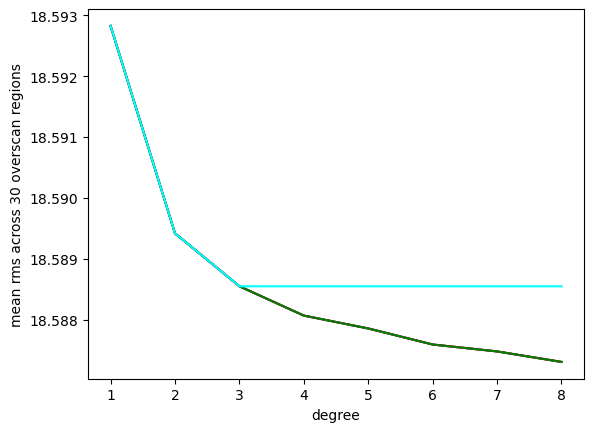

In [ ]:
domain = range(1, 9)
plt.plot(domain, np.mean(cheb_orms, axis=1), color='blue')
plt.plot(domain, np.mean(lege_orms, axis=1), color='red')
plt.plot(domain, np.mean(herm_orms, axis=1), color='green')
plt.plot(domain, np.mean(poly_orms, axis=1), color='cyan')
plt.xlabel('degree')
plt.ylabel('mean rms across 30 overscan regions')

* gains in degree begin to flatline around 3rd degree. will compare across 3rd \
degree models to pick which to use

In [ ]:
rms_list = [cheb_orms, lege_orms, herm_orms, poly_orms]
name_list = ['cheb', 'lege', 'herm', 'poly']

for idx, model in enumerate(rms_list):
    print(f'{name_list[idx]} RMS:   {np.mean(model, axis=1)[2]}')

cheb RMS:   18.588548808205605
lege RMS:   18.5885488082056
herm RMS:   18.5885488082056
poly RMS:   18.588548808205605


* all about the same. picking Chebyshev because I like the name

In [ ]:
imgs.files_filtered(imagetyp='NGC6823', include_path=True)

[]

In [ ]:
# trimming NGC6823 + Bias Frames
# ’chebyshev’, ’legendre’, and ’hermite’, and ’polynomial'

frames = imgs.files_filtered(imagetyp='NGC6823', include_path=True) + \
    imgs.files_filtered(imagetyp='Bias', include_path=True)

for fidx, file in enumerate(frames):
    # define model
    cheb = Chebyshev1D(3)
    img = CCDData.read(file, unit='adu')
    # modeling + subtracting overscan + saving all the versions for comparison
    img_cheb = ccdp.subtract_overscan(img, overscan=img[:, 2099:], model=cheb)
    cheb_array[degree-1, fidx, :, :] = np.array(img_cheb)
    # trimming off overscan regions
    img_chebt = ccdp.trim_image(img_cheb[:, :2099])
    img_chebt = ccdp.trim_image(img_cheb[:, 55:])
    # saving subtracted/trimmed images
    img_chebt.write(reduced_dir + file[83:-5] + '_ot.fits', overwrite=True)


In [ ]:
cheb_array.shape

(8, 30, 2048, 2200)

In [ ]:
# memory clearing
del cheb_array
del lege_array
del herm_array
del poly_array
del cheb_omean
del lege_omean
del herm_omean
del poly_omean
del cheb_omedi
del lege_omedi
del herm_omedi
del poly_omedi

NameError: name 'cheb_array' is not defined

* not doing NGC6823 frames???

# 7

In [ ]:
imgs_ot = ccdp.ImageFileCollection(reduced_dir, glob_include='*_ot.fits')

In [ ]:
bias_ot = imgs_ot.files_filtered(imagetyp='Bias', include_path=True)

In [ ]:
img = fits.open(bias)[0].data.shape
print(img)

(2048, 2145)


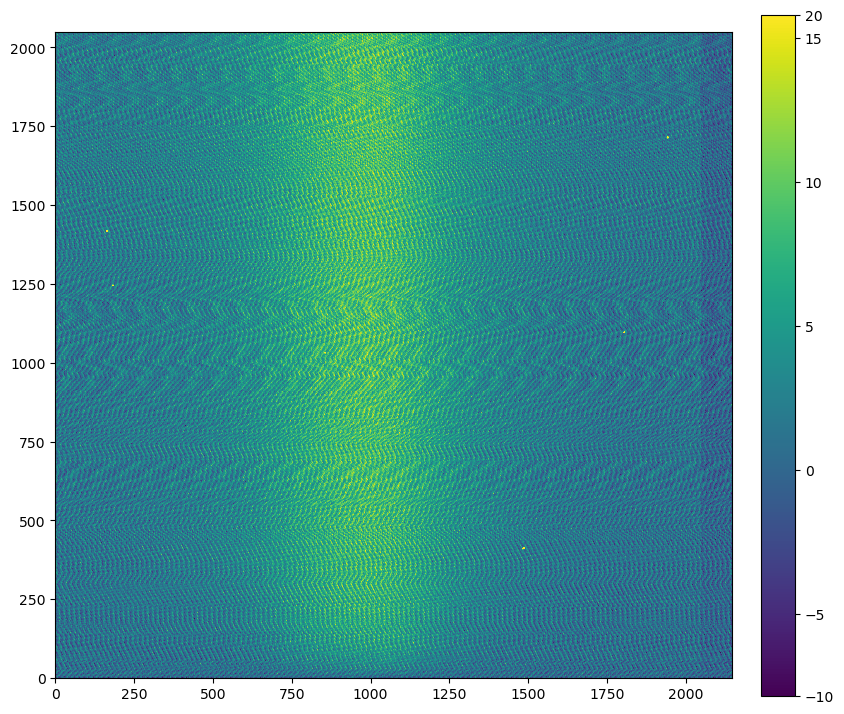

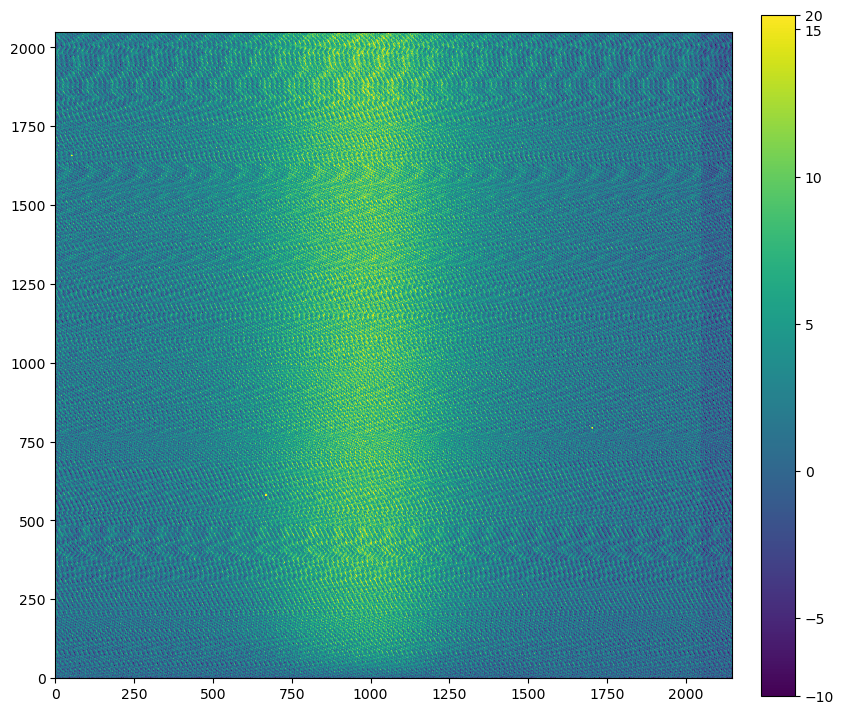

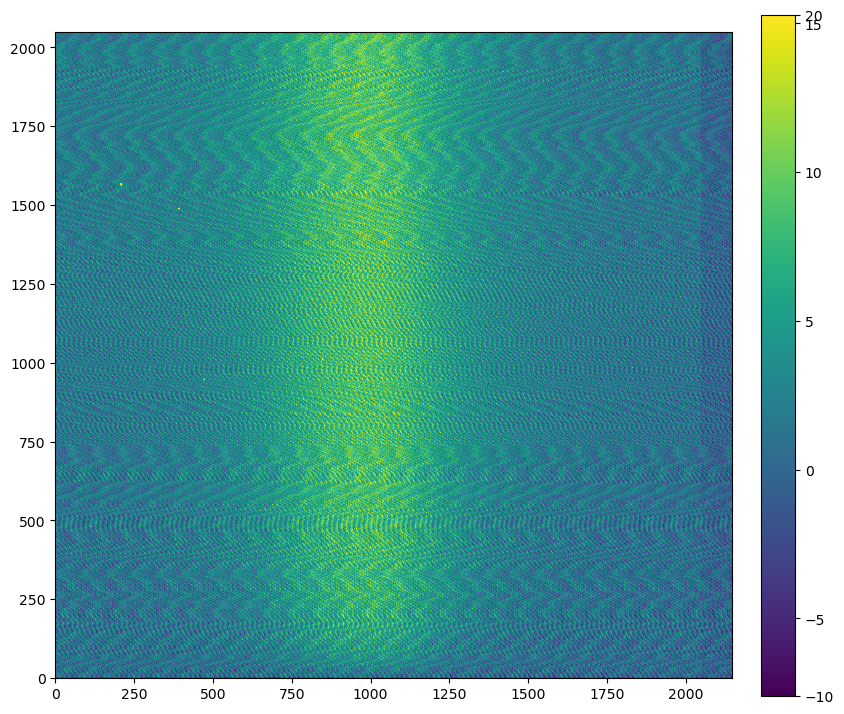

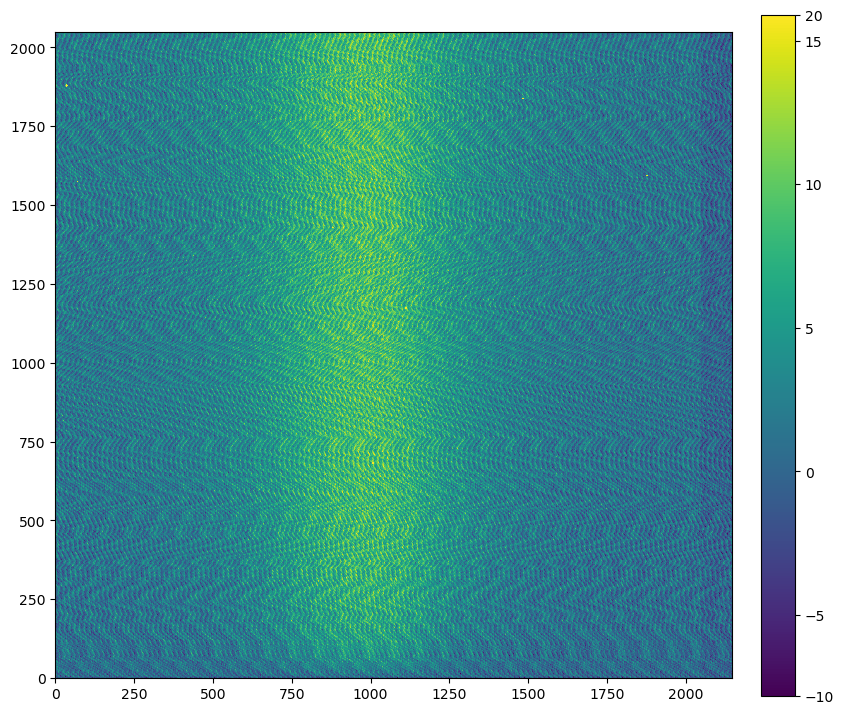

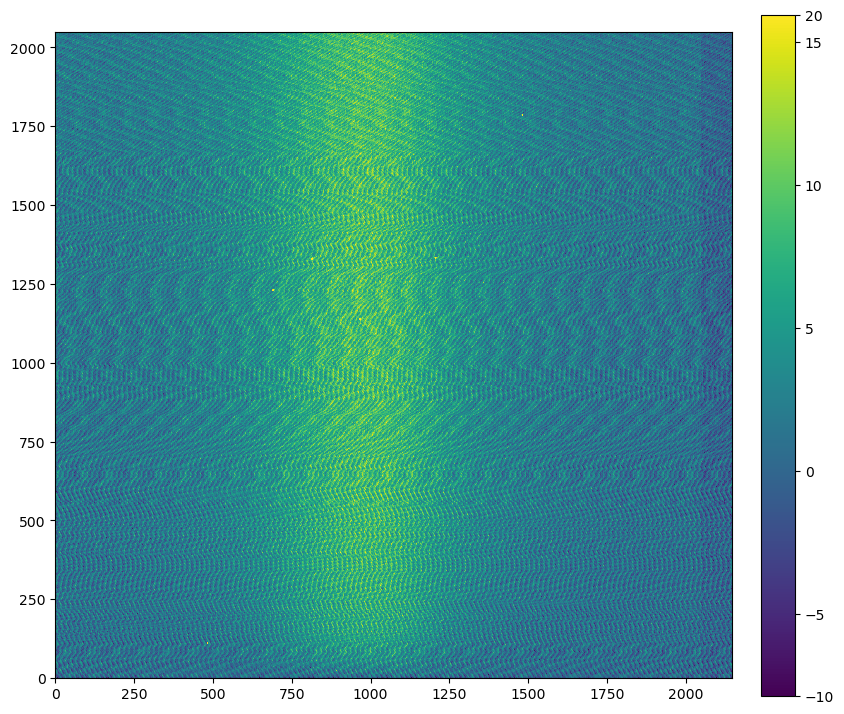

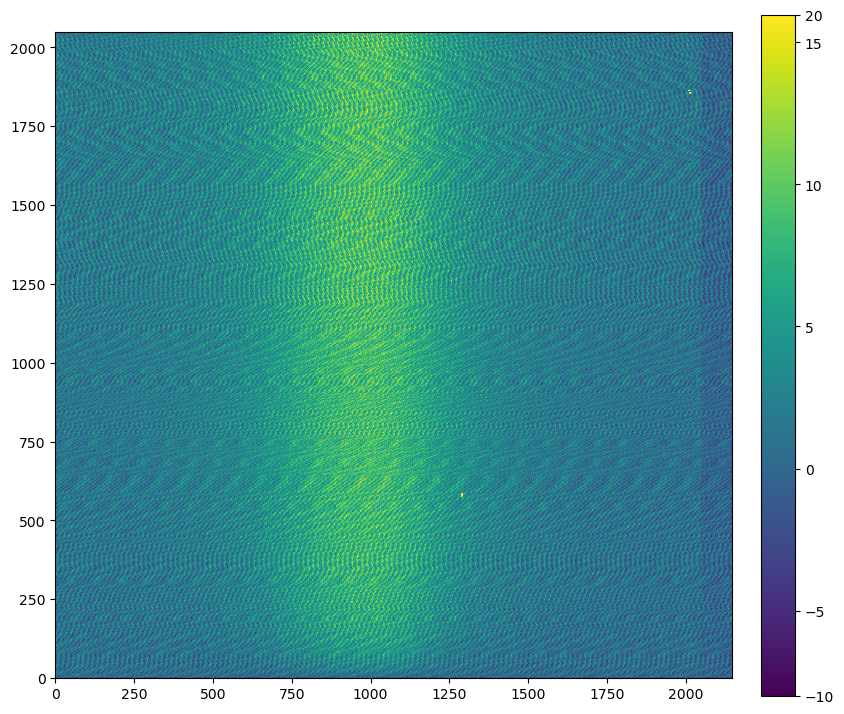

In [159]:
biasframe_arr = np.zeros(shape=(6, 2048, 2145))

for idx, bias in enumerate(bias_ot):
    hdu = fits.open(bias)
    hdr = hdu[0].header
    img = hdu[0].data
    biasframe_arr[idx] = img
    show_image(img)

* wiggles going across the bias frames change from frame to frame + hot pixels.

In [1]:
def calc_rms(array):
    return np.sqrt(np.mean(array**2))

In [2]:
biasframe_arr.shape

NameError: name 'biasframe_arr' is not defined

In [ ]:
biasframe_rms = []
for idx

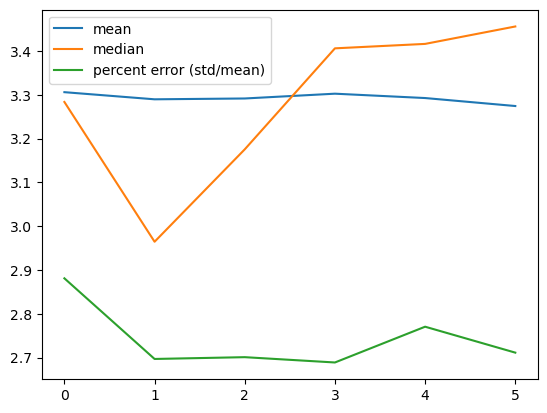

In [160]:
fig, ax = plt.subplots()
plt.plot(np.mean(biasframe_arr, axis=(1,2)), label='mean')
plt.plot(np.median(biasframe_arr, axis=(1,2)), label='median')
plt.plot(np.std(biasframe_arr, axis=(1,2))/np.mean(biasframe_arr, axis=(1,2)), label='percent error (std/mean)')
plt.legend()

* not a lot of variation in mean + percent error doesn't change a lot. checking\
image. Median has some variation.

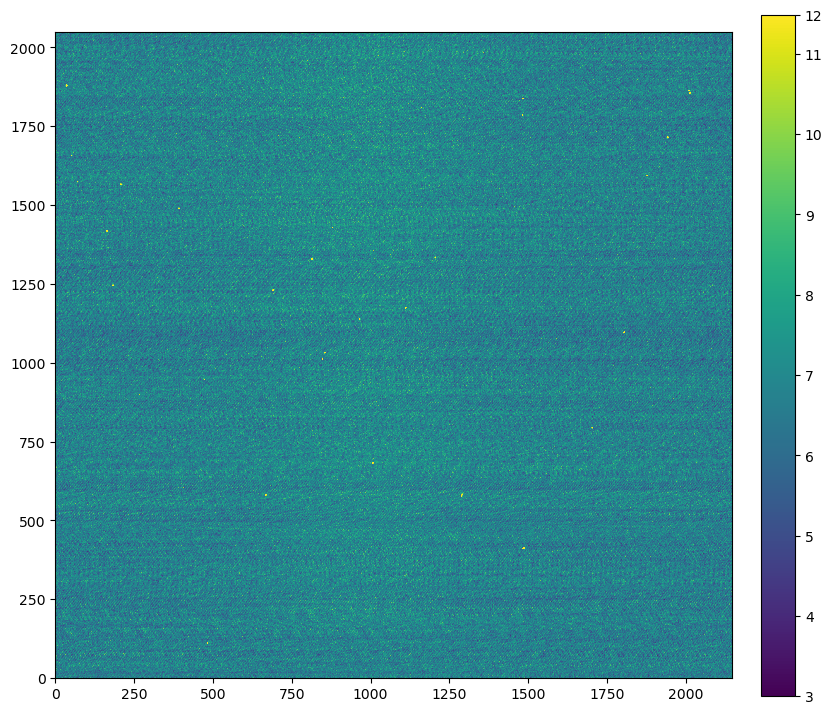

In [ ]:
show_image(np.std(biasframe_arr, axis=0))

* from the above image there isn't a ton of variation across the bias frames\
other that what seem to be some hot pixels. I think I can justify a combination.

In [169]:
# making master_bias frame
ms_bias_medi = ccdp.combine(bias_ot, method='median', sigma_clip=True,\
    sigma_clip_high_thresh=2.0)
ms_bias_mean = ccdp.combine(bias_ot)

* average method for combining (default) seems to leave in the hot pixels that\
aren't consistent across bias frames. median removes them but it seems like it\
smoothes out random vertical wiggles in the frames... sigma clipping isn't\
fixing it i don't think??? Will try doing bias subtraction using this combined\
one and see what happens. Serious wiggles present in images with this subtraction.

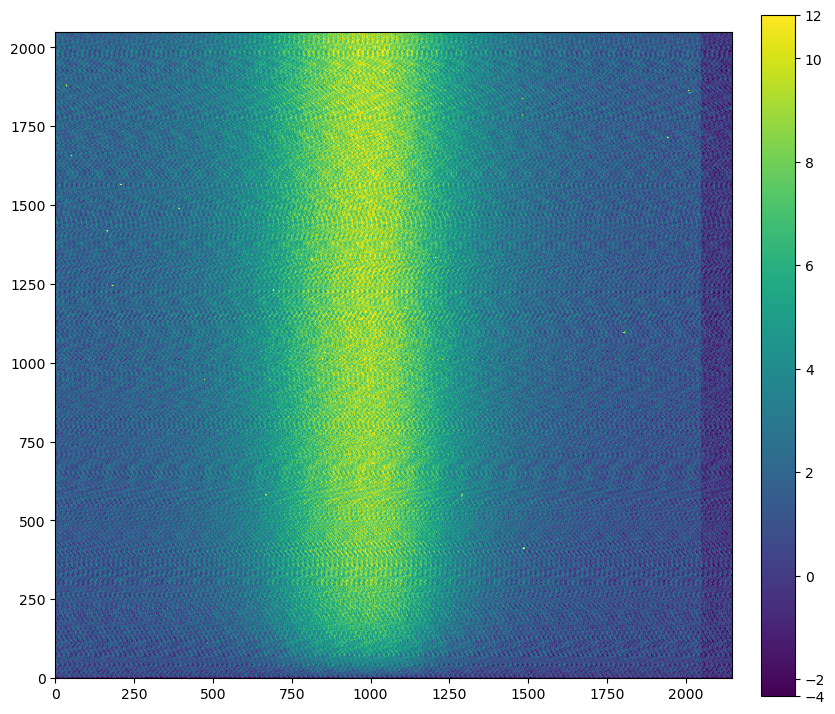

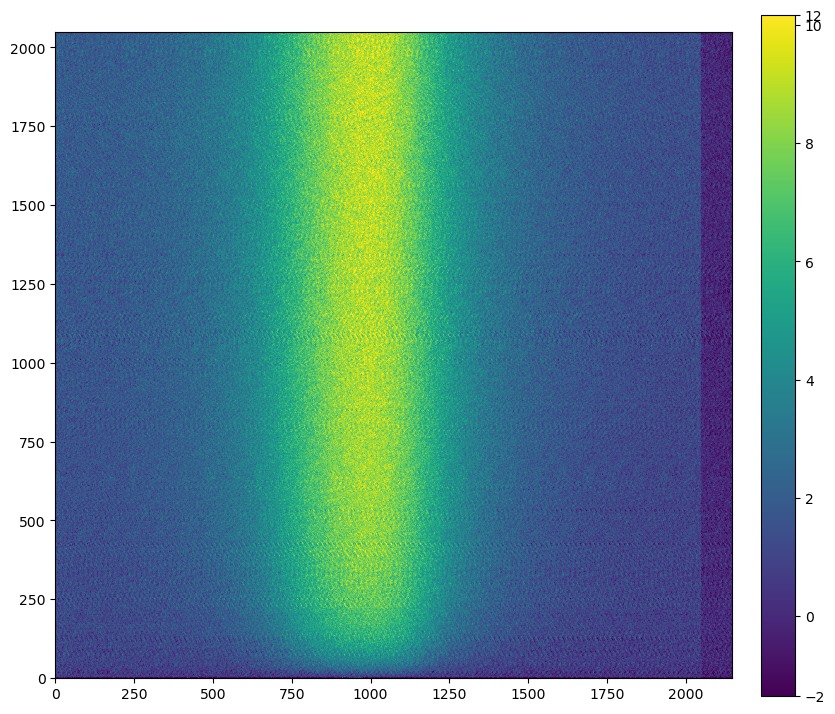

In [170]:
show_image(ms_bias_mean)
show_image(ms_bias_medi)

In [176]:
PG_ot = imgs_ot.files_filtered(imagetyp='PG1633+099', include_path=True)

In [178]:
len(PG_ot)

32

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


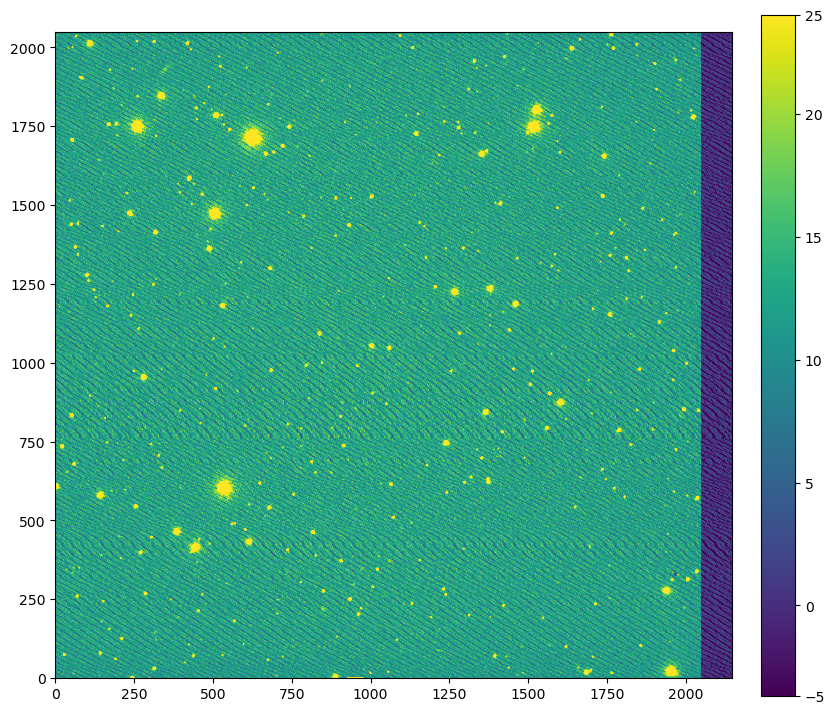

In [185]:
bias_subtracted = ccdp.subtract_bias(CCDData.read(PG_ot[0], unit='adu'), ms_bias_medi)
show_image(bias_subtracted)

* need to subtract overscan from all images + biases first then trim all of the\
overscans off before applying the bias image section to images.